In [1]:
import os
import folium
from glob import glob
import matplotlib.pyplot as plt
import numpy as np
import rasterio as rio
from rasterio.plot import show, plotting_extent
from rasterio.merge import merge
from PIL import Image, ImageChops


# mosaic unwrapped IFGs
unw_files_to_mosaic = []
for file in glob("hello_world*/filt_topophase.unw.geo"):
    src = rio.open(file)
    unw_files_to_mosaic.append(src)
unw_mosaic, unw_out_trans = merge(unw_files_to_mosaic, nodata=0)
unw_mosaic[unw_mosaic==0] = np.nan
unw_extent = plotting_extent(unw_mosaic, unw_out_trans)

# mosaic wrapped IFGs
flat_files_to_mosaic = []
for file in glob("hello_world*/filt_topophase.flat.geo"):
    src = rio.open(file)
    flat_files_to_mosaic.append(src)
flat_mosaic, flat_out_trans = merge(flat_files_to_mosaic, nodata=0)
flat_mosaic[flat_mosaic==0] = np.nan
flat_extent = plotting_extent(flat_mosaic, flat_out_trans)

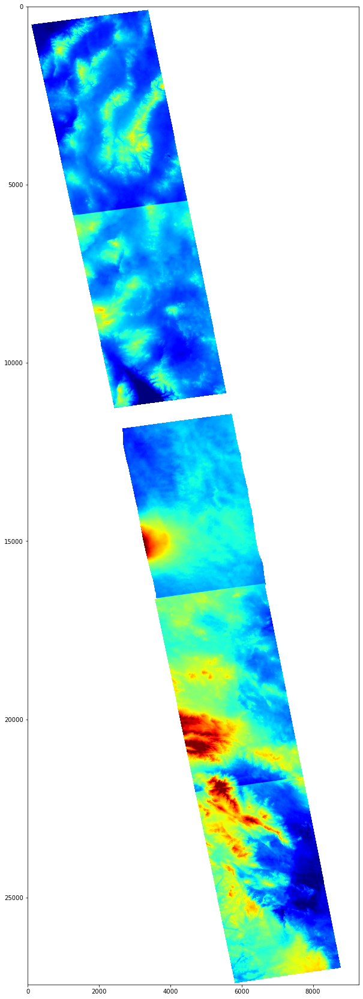

In [2]:
# plot unwrapped IFG mosaic
fig, ax = plt.subplots(1, figsize=(20, 30))
show(unw_mosaic[1], cmap='jet', vmin=-20, vmax=50, ax=ax)
fig.savefig('unw.png', transparent=True)

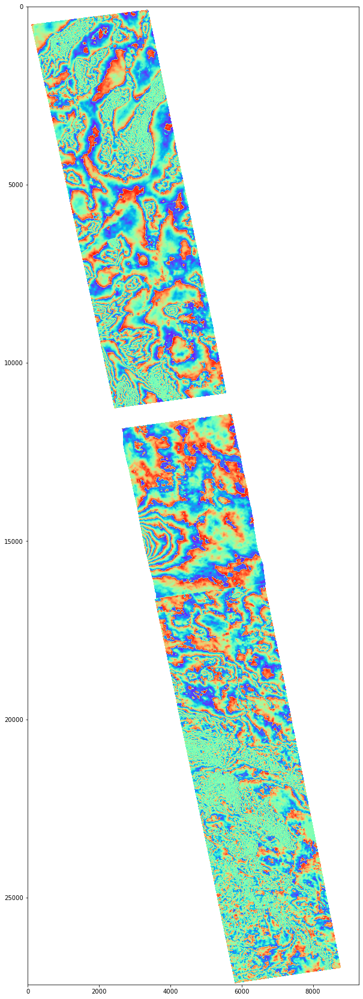

In [3]:
# plot wrapped IFG mosaic
fig, ax = plt.subplots(1, figsize=(20, 30))
show(np.angle(flat_mosaic[0]), cmap='rainbow', vmin=-np.pi, vmax=np.pi, ax=ax)
fig.savefig('flat.png', transparent=True)

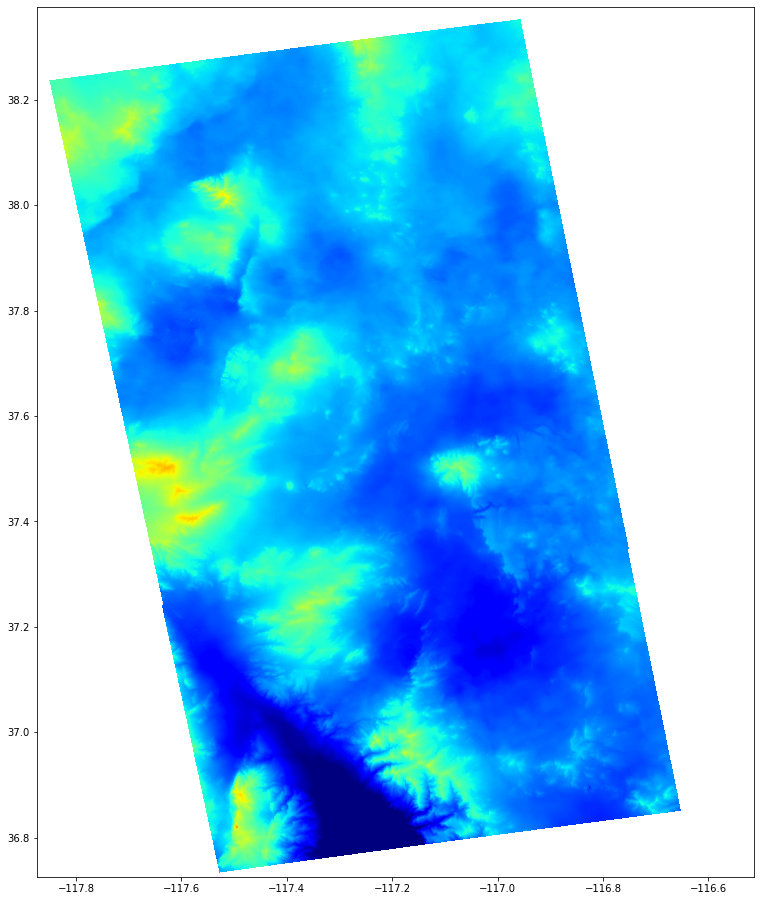

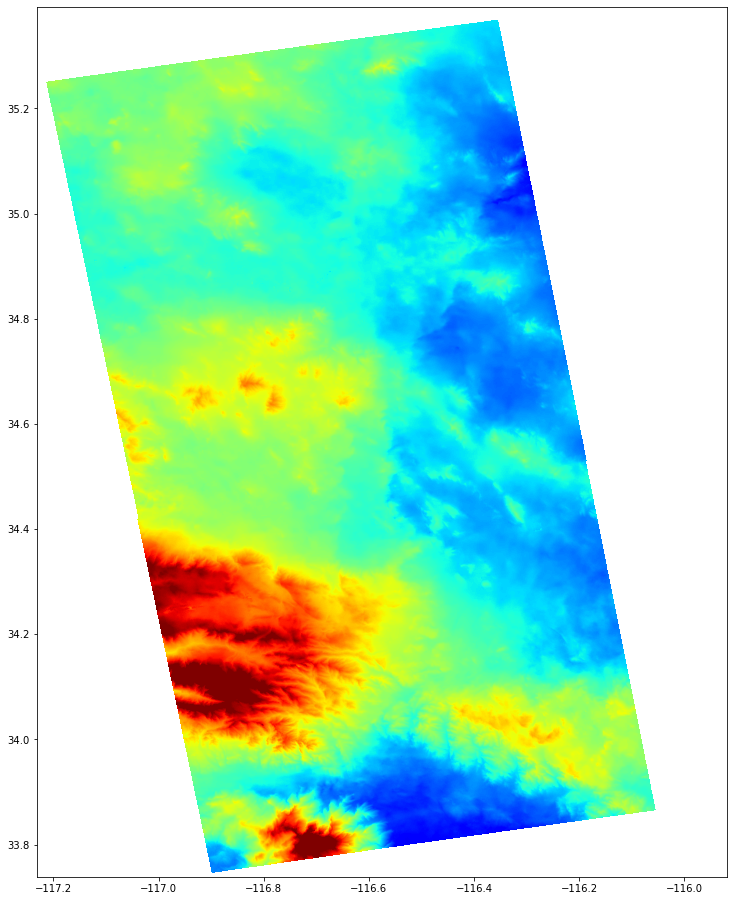

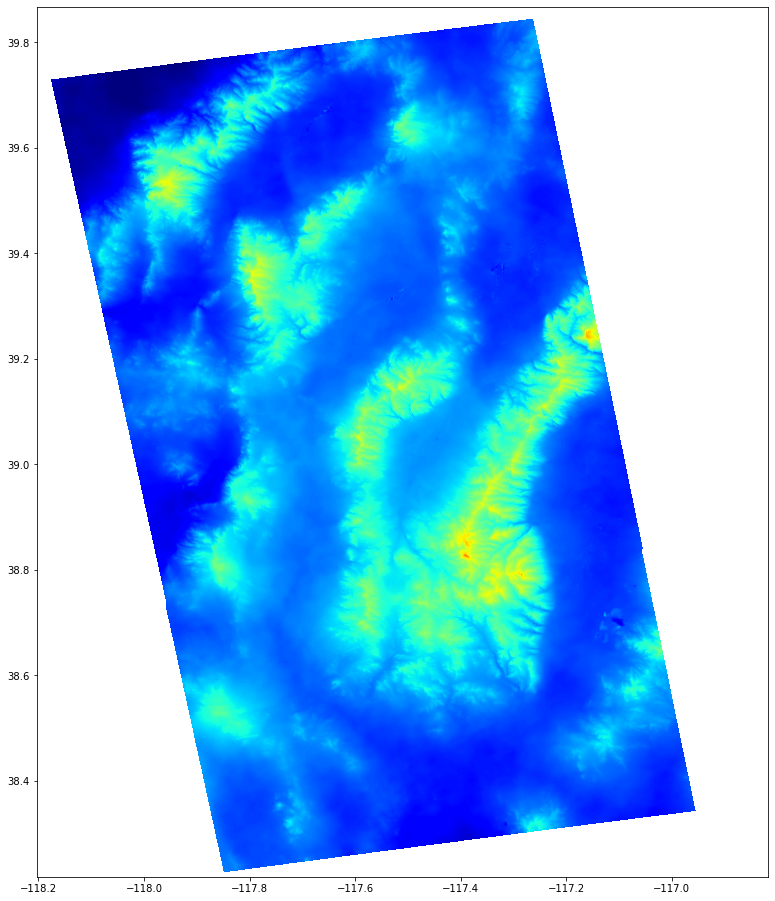

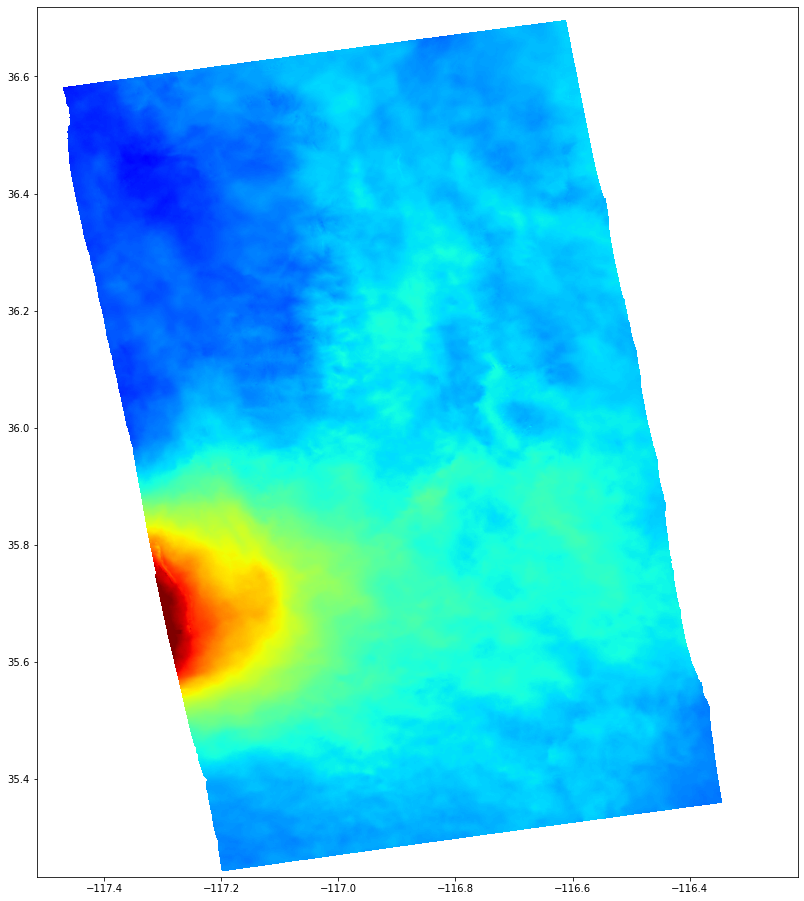

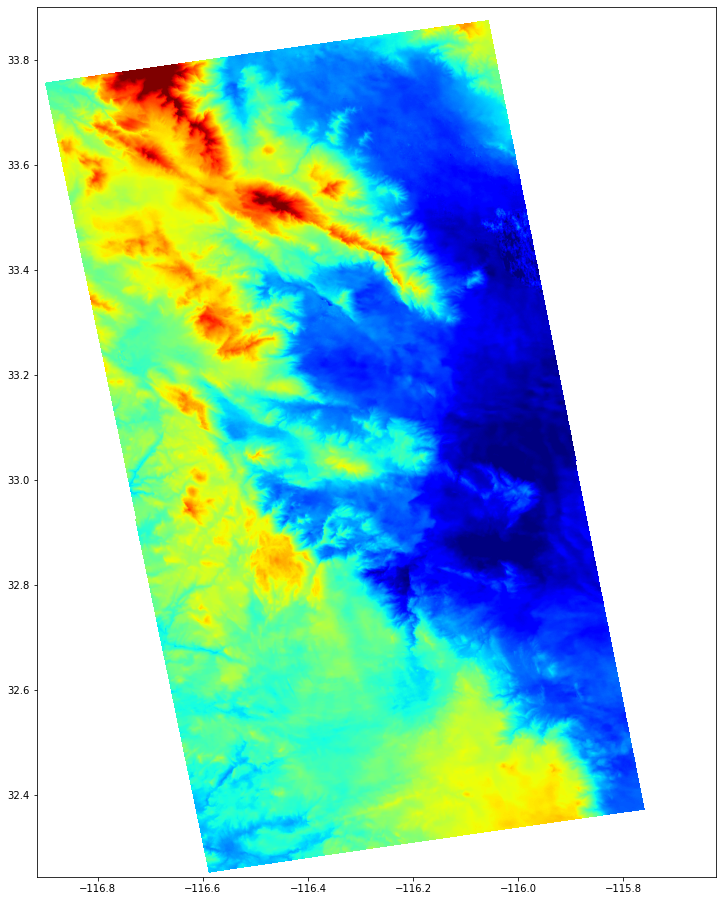

In [4]:
# plot unwrapped IFGs individually
unw_plots = []
unw_bboxes = []
for i, file in enumerate(glob("hello_world*/filt_topophase.unw.geo")):
    src = rio.open(file)
    fig, ax = plt.subplots(1, figsize=(18, 16))
    data = src.read(2)
    data[data==0] = np.nan
    show(data, cmap='jet', vmin=-20, vmax=50, transform=src.transform, ax=ax)
    png_file = f'unw_{i}.png'
    fig.savefig(png_file, transparent=True)
    unw_plots.append(png_file)
    unw_bboxes.append(src.bounds)

In [5]:
# function to trim png images
def trim(img):
    border = Image.new(img.mode, img.size, img.getpixel((0, 0)))
    diff = ImageChops.difference(img, border)
    diff = ImageChops.add(diff, diff, 2.0, -100)
    bbox = diff.getbbox()
    if bbox:
        img = img.crop(bbox)
    return np.array(img)

In [6]:
# plot unwrapped IFGs in folium map
m = folium.Map(location=[35.71975793933433, -117.8668212890625],
               tiles='Stamen Terrain', zoom_start=6)
for i, plot in enumerate(unw_plots):
    bounds = [[unw_bboxes[i].bottom, unw_bboxes[i].left],
              [unw_bboxes[i].top, unw_bboxes[i].right]]
    img = trim(Image.open(plot))
    o = folium.raster_layers.ImageOverlay(image=img,
                                          bounds=bounds,
                                          opacity=.7,
                                          interactive=True,
                                          cross_origin=False)
    o.add_to(m)
folium.LayerControl().add_to(m)             
m

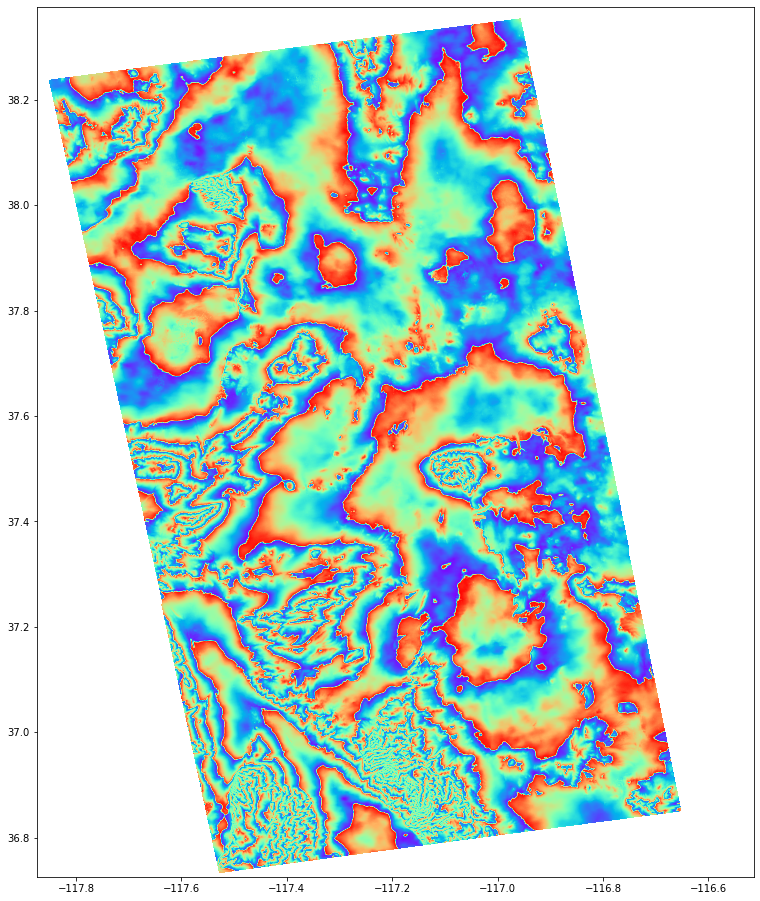

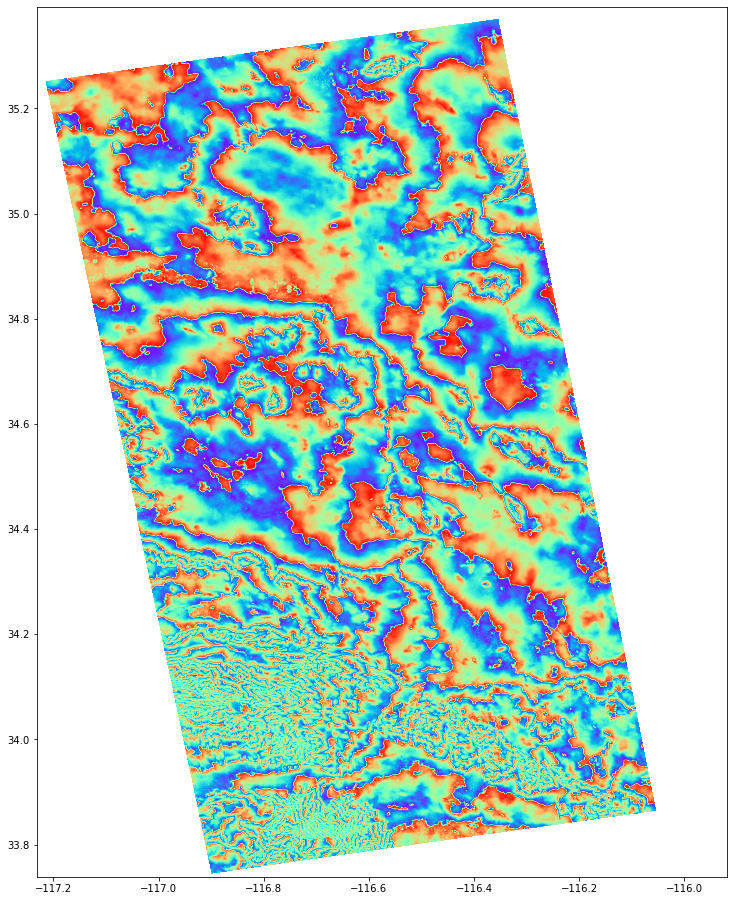

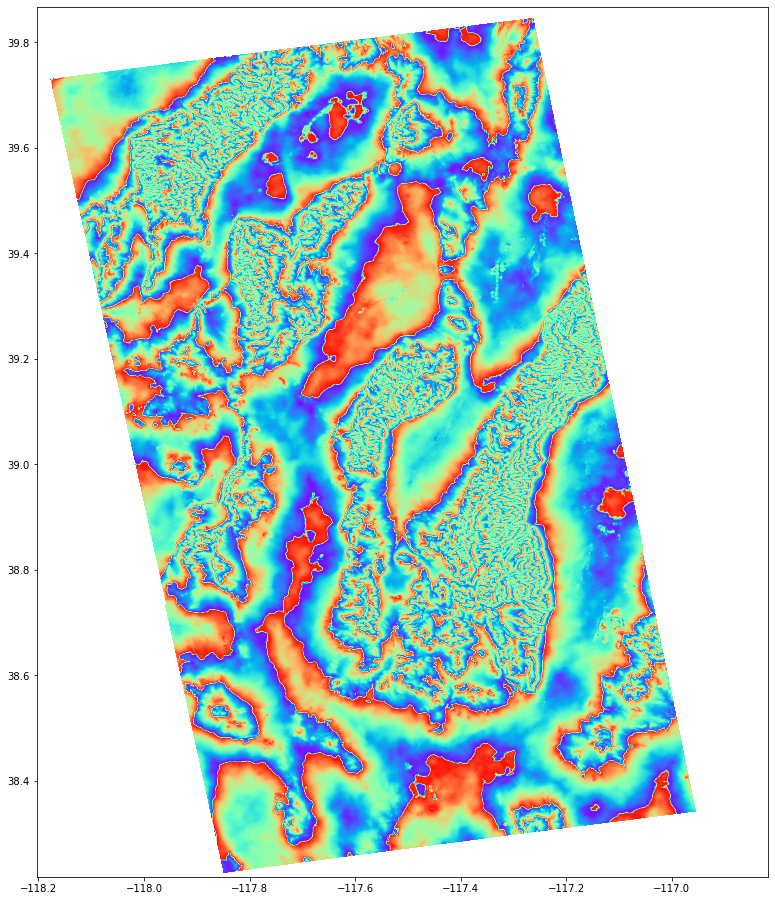

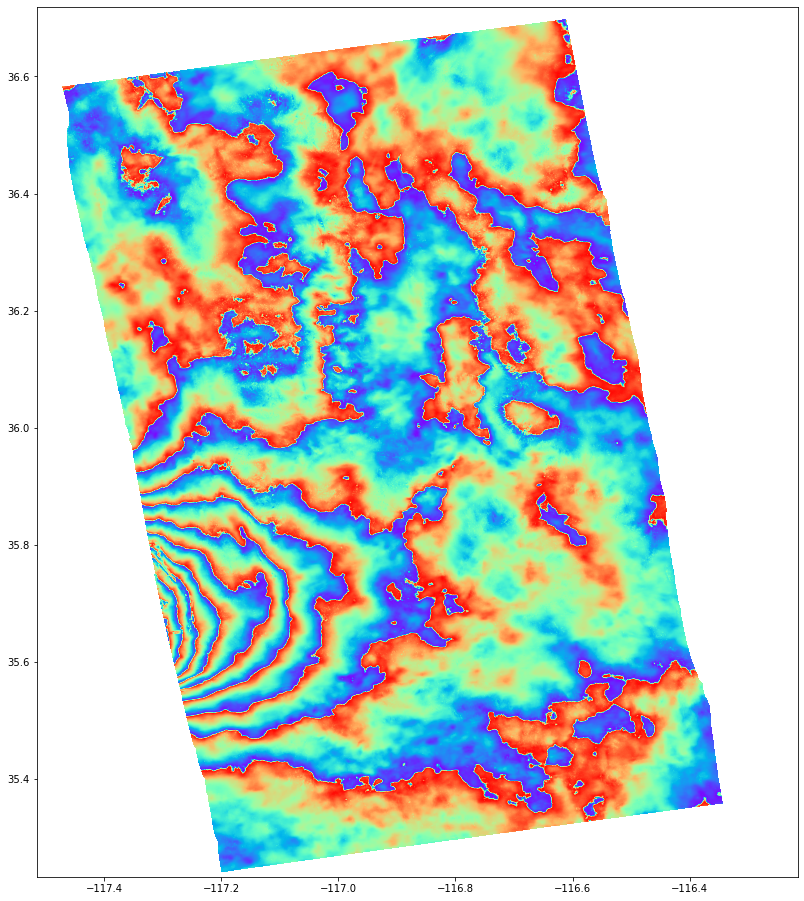

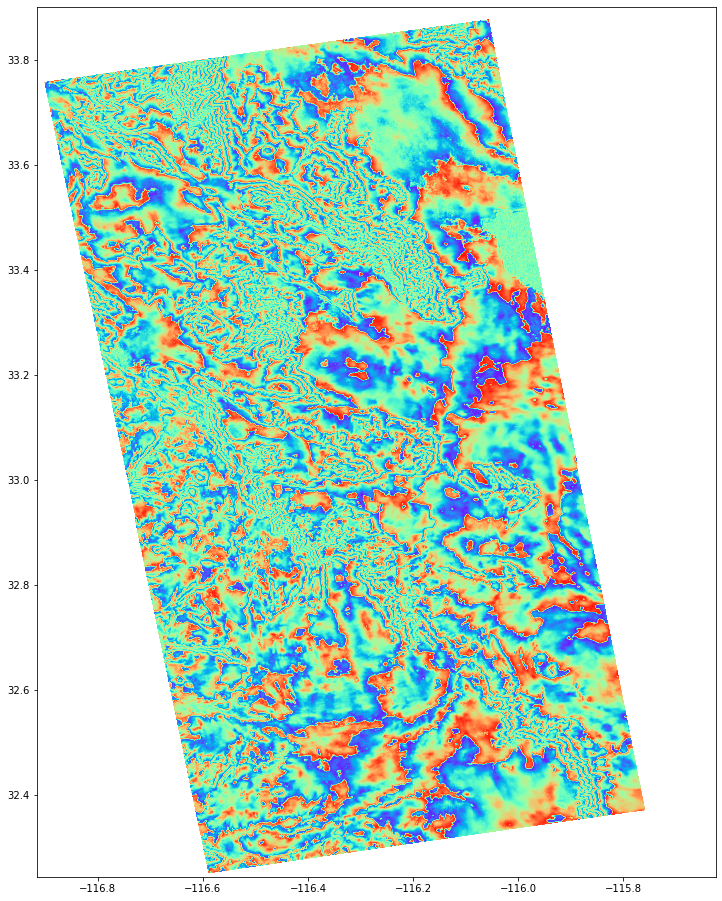

In [7]:
# plot wrapped IFGs individually
flat_plots = []
flat_bboxes = []
for i, file in enumerate(glob("hello_world*/filt_topophase.flat.geo")):
    src = rio.open(file)
    fig, ax = plt.subplots(1, figsize=(18, 16))
    data = src.read(1)
    data[data==0] = np.nan
    show(np.angle(data), cmap='rainbow', vmin=-np.pi, vmax=np.pi, transform=src.transform, ax=ax)
    png_file = f'flat_{i}.png'
    fig.savefig(png_file, transparent=True)
    flat_plots.append(png_file)
    flat_bboxes.append(src.bounds)

In [8]:
# plot wrapped IFGs in folium map
m = folium.Map(location=[35.71975793933433, -117.8668212890625],
               tiles='Stamen Terrain', zoom_start=6)
for i, plot in enumerate(flat_plots):
    bounds = [[flat_bboxes[i].bottom, flat_bboxes[i].left],
              [flat_bboxes[i].top, flat_bboxes[i].right]]
    img = trim(Image.open(plot))
    o = folium.raster_layers.ImageOverlay(image=img,
                                          bounds=bounds,
                                          opacity=.7,
                                          interactive=True,
                                          cross_origin=False)
    o.add_to(m)
folium.LayerControl().add_to(m)             
m